## Layout the UMAP points on a grid
We use linear assignment to layout the points on the grid. I also experimented with a force-directed layout, but it does not seem to improve the layout.


In [1]:
# average the embeddings for top10 samples for each feature, then umap that
import pandas as pd
import numpy as np
# import h5py
import umap
import os

/Users/enjalot/code/latent-taxonomy/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# TODO: we would want to do this on the umap above, but since i don't want to recompute it, for now i'm using the published features parquet for this model
fdf = pd.read_parquet("https://enjalot.github.io/latent-taxonomy/models/NOMIC_FWEDU_25k/features.parquet")

In [3]:
fdf.head()

,feature,max_activation,x,y,top10_x,top10_y,label,order
0,0,0.297291,-0.303497,0.625081,0.515561,-0.068958,genomic and molecular imprinting concepts,0.835001
1,1,0.166444,-0.742769,-0.499167,-0.758344,0.305733,Hildegard of Bingen's spiritual and creative l...,0.665455
2,2,0.240715,-0.374569,-0.632960,-0.179834,0.175429,Fairchild Semiconductor and Silicon Valley legacy,0.583131
3,3,0.273029,-0.310232,-0.219518,-0.729569,-0.154941,socialism political ideology economic equality,0.346067
4,4,0.301342,-0.400855,-0.180536,-0.344582,-0.491325,vowel sound definitions and teaching methods,0.437009


In [77]:
from scipy.spatial import cKDTree
from scipy.optimize import linear_sum_assignment
from tqdm.auto import tqdm
import time


def chunked_linear_assignment(cost_matrix, chunk_size=1000, verbose=True):
    """
    Solves the linear assignment problem in chunks to allow progress tracking.
    For very large matrices, this approach is more memory efficient and
    provides progress feedback.
    
    Args:
        cost_matrix: The cost matrix for the assignment problem
        chunk_size: Size of chunks to process
        verbose: Whether to display progress information
    
    Returns:
        Tuple of (row_indices, col_indices) for the optimal assignment
    """
    n, m = cost_matrix.shape
    
    # If the matrix is small enough, use the standard approach
    if n <= chunk_size:
        if verbose:
            print(f"Using standard linear_sum_assignment for {n}x{m} matrix...")
            start_time = time.time()
        
        row_ind, col_ind = linear_sum_assignment(cost_matrix)
        
        if verbose:
            elapsed = time.time() - start_time
            print(f"Assignment completed in {elapsed:.2f} seconds")
        
        return row_ind, col_ind
    
    # For larger matrices, process in chunks
    if verbose:
        print(f"Processing {n}x{m} assignment matrix in chunks of {chunk_size}...")
    
    remaining_rows = list(range(n))
    remaining_cols = list(range(m))
    
    final_row_ind = []
    final_col_ind = []
    
    # Process in chunks until all rows are assigned
    chunk_iter = tqdm(range(0, n, chunk_size)) if verbose else range(0, n, chunk_size)
    for chunk_start in chunk_iter:
        if not remaining_rows:
            break
            
        chunk_end = min(chunk_start + chunk_size, n)
        chunk_size_actual = min(chunk_size, len(remaining_rows))
        
        if verbose:
            chunk_iter.set_description(f"Processing rows {chunk_start}-{chunk_end-1}")
        
        # Select chunk of rows and all remaining columns
        row_indices = remaining_rows[:chunk_size_actual]
        chunk_cost = cost_matrix[row_indices, :][:, remaining_cols]
        
        # Solve the subproblem
        sub_row_ind, sub_col_ind = linear_sum_assignment(chunk_cost)
        
        # Map back to original indices
        for i, j in zip(sub_row_ind, sub_col_ind):
            final_row_ind.append(remaining_rows[i])
            final_col_ind.append(remaining_cols[j])
        
        # Remove assigned rows and columns
        cols_to_remove = [remaining_cols[j] for j in sub_col_ind]
        remaining_cols = [c for c in remaining_cols if c not in cols_to_remove]
        remaining_rows = remaining_rows[chunk_size_actual:]
        
        if verbose:
            chunk_iter.set_postfix(remaining=len(remaining_rows))
    
    if verbose:
        print(f"Chunked assignment complete - assigned {len(final_row_ind)} points")
    
    return np.array(final_row_ind), np.array(final_col_ind)

def align_points_to_grid(points, grid_size=(160, 160), verbose=True, chunk_size=1000):
    """
    Aligns scattered points to a regular grid while attempting to preserve
    relative positions.
    
    Args:
        points: numpy array of shape (n, 2) containing the input points (x, y)
        grid_size: tuple (width, height) for the target grid
        preserve_factor: factor to balance between original distances and grid alignment
                        (higher values preserve original distances more)
        verbose: whether to display progress information
        chunk_size: size of chunks for the assignment algorithm (smaller chunks use less memory)
    
    Returns:
        numpy array of shape (n, 2) with the aligned grid positions
    """
    # Number of points
    n_points = len(points)
    
    if verbose:
        print(f"Processing {n_points} points...")
    
    # Create target grid
    grid_width, grid_height = grid_size
    n_grid_cells = grid_width * grid_height
    
    if n_points > n_grid_cells:
        print(f"Warning: More points ({n_points}) than grid cells ({n_grid_cells}). Some points will share cells.")
    
    if verbose:
        print("Normalizing points...")
    
    # Normalize original points to [0, 1] range
    points_min = points.min(axis=0)
    points_max = points.max(axis=0)
    points_norm = (points - points_min) / (points_max - points_min)
    
    if verbose:
        print(f"Creating {grid_width}x{grid_height} grid...")
    
    # Create regular grid in [0, 1] x [0, 1]
    x_grid = np.linspace(0, 1, grid_width)
    y_grid = np.linspace(0, 1, grid_height)
    xx, yy = np.meshgrid(x_grid, y_grid)
    grid_points = np.column_stack([xx.ravel(), yy.ravel()])
    
    # If we have more grid points than data points, select a subset
    if len(grid_points) > n_points:
        if verbose:
            print(f"Selecting {n_points} grid points from {len(grid_points)} available...")
        
        # Create a KDTree for the normalized points
        tree = cKDTree(points_norm)
        
        # For each grid point, find the closest original point
        if verbose:
            print("Finding closest original points to grid points...")
            distances, indices = tree.query(grid_points, k=1, workers=-1)  # Use multiple cores
        else:
            distances, indices = tree.query(grid_points, k=1)
        
        # Sort grid points by distance to their closest original point
        if verbose:
            print("Sorting grid points by distance...")
        sorted_indices = np.argsort(distances)
        grid_points = grid_points[sorted_indices[:n_points]]
    
    # If we have more data points than grid points, we'll use available grid cells
    # and potentially have multiple points per cell
    elif len(grid_points) < n_points:
        # Duplicate grid points to match number of data points
        grid_indices = np.random.choice(len(grid_points), n_points, replace=True)
        grid_points = grid_points[grid_indices]
    
    # Compute cost matrix for assignment problem
    if verbose:
        print("Computing cost matrix for assignment problem...")
        start_time = time.time()
    
    cost_matrix = np.zeros((n_points, len(grid_points)))
    
    # Mix of original distances and assignment to grid
    # Using tqdm for progress tracking
    if verbose:
        for i in tqdm(range(n_points), desc="Computing distances", unit="point"):
            # Cost is Euclidean distance between normalized original point and grid point
            cost_matrix[i] = np.sqrt(np.sum((points_norm[i] - grid_points)**2, axis=1))
    else:
        for i in range(n_points):
            cost_matrix[i] = np.sqrt(np.sum((points_norm[i] - grid_points)**2, axis=1))
    
    if verbose:
        elapsed = time.time() - start_time
        print(f"Cost matrix computation completed in {elapsed:.2f} seconds")
    
    # Solve assignment problem using our chunked implementation
    if verbose:
        print("Solving assignment problem with progress tracking...")
    
    row_ind, col_ind = chunked_linear_assignment(cost_matrix, chunk_size=chunk_size, verbose=verbose)
    
    if verbose:
        print("Applying grid alignment...")
    
    # Assign each point to its optimal grid position
    # The row_ind tells us which original point, and col_ind tells us which grid point
    # We need to sort them to ensure points are aligned with their original indices
    sorted_indices = np.argsort(row_ind)
    aligned_points = grid_points[col_ind[sorted_indices]]
    
    # Scale aligned points back to original range
    aligned_points = aligned_points * (points_max - points_min) + points_min
    
    # Blend between original positions and grid positions based on preserve_factor
    # final_points = preserve_factor * points + (1 - preserve_factor) * aligned_points
    
    if verbose:
        print("Grid alignment completed successfully!")
        
    return aligned_points

In [73]:
import os
from sklearn.neighbors import NearestNeighbors
from scipy.spatial import cKDTree
def force_directed_layout_ann(points, 
                          radius=1.0, 
                          iterations=100, 
                          dt=0.1, 
                          repulsion_strength=0.1, 
                          center_strength=0.01, 
                          damping=0.6,
                          n_neighbors=30,
                          output_dir=None,
                          plot_interval=10,
                          verbose=True):
    """
    Apply a force-directed layout with elastic collisions to spread out points.
    Uses Approximate Nearest Neighbors for significantly faster computation.
    
    Args:
        points: numpy array of shape (n, 2) containing the input points (x, y)
        radius: effective radius of each point for collision detection
        iterations: number of simulation steps
        dt: time step size (smaller values give more stable, gradual movement)
        repulsion_strength: strength of repulsive forces between points
        center_strength: strength of force pulling points toward their original positions
        damping: velocity damping factor (0 to 1, higher means more damping)
        n_neighbors: number of nearest neighbors to consider for force calculation
        output_dir: directory to save progression plots (None for no plotting)
        plot_interval: save a plot every N iterations
        verbose: whether to display progress information
    
    Returns:
        numpy array of shape (n, 2) with the relaxed point positions
    """
    # Number of points
    n_points = len(points)
    
    # Print out execution plan and parameters
    if verbose:
        if n_points > 10000:
            print(f"Large dataset detected ({n_points} points). Optimizations will be applied.")
        print(f"Starting force-directed layout using ANN with {n_neighbors} neighbors per point")
        print(f"Parameters: radius={radius}, dt={dt}, iterations={iterations}")
    
    # Create a copy of the input points to work with
    positions = points.copy()
    
    # Initialize velocities
    velocities = np.zeros_like(positions)
    
    # Store original positions
    original_positions = points.copy()
    
    # Set up plotting if output_dir is specified
    if output_dir is not None:
        try:
            import matplotlib.pyplot as plt
            os.makedirs(output_dir, exist_ok=True)
            plot_enabled = True
            
            # Calculate bounds for consistent plotting
            x_min, y_min = np.min(points, axis=0) - radius * 5
            x_max, y_max = np.max(points, axis=0) + radius * 5
            
            if verbose:
                print(f"Plots will be saved to {output_dir} every {plot_interval} iterations")
        except ImportError:
            if verbose:
                print("Matplotlib not available, plotting disabled")
            plot_enabled = False
    else:
        plot_enabled = False
    
    # Force calculation using ANN
    def calculate_forces_ann():
        # Build KD-tree for neighbor search
        tree = cKDTree(positions)
        
        # Initialize forces array
        forces = np.zeros_like(positions)
        
        # For each point, find nearest neighbors and calculate forces
        for i in range(n_points):
            # Query for nearest neighbors within 2*radius
            # This is more efficient than a fixed number of neighbors when density varies
            indices = tree.query_ball_point(positions[i], 2 * radius)
            
            # Remove self from indices
            indices = [idx for idx in indices if idx != i]
            
            if not indices:  # Skip if no neighbors found
                continue
                
            # Calculate differences and distances
            neighbors = positions[indices]
            diff = positions[i] - neighbors
            dist_squared = np.sum(diff**2, axis=1)
            distances = np.sqrt(dist_squared)
            
            # Calculate unit vectors
            unit_vectors = diff / distances[:, np.newaxis]
            
            # Calculate repulsive force magnitudes
            force_magnitudes = repulsion_strength * (2 * radius - distances)**2 / (distances + 0.1)
            
            # Sum forces from all neighbors
            forces[i] = np.sum(unit_vectors * force_magnitudes[:, np.newaxis], axis=0)
        
        # Add centering force to pull points toward their original positions
        center_forces = (original_positions - positions) * center_strength
        forces += center_forces
        
        return forces
    
    # Save plot of current state
    def save_plot(iteration):
        if not plot_enabled:
            return
            
        plt.figure(figsize=(10, 10))
        plt.scatter(positions[:, 0], positions[:, 1], alpha=0.5, s=radius*50, edgecolors='none')
        plt.axis('off')
        plt.xlim(x_min, x_max)
        plt.ylim(y_min, y_max)
        plt.gca().set_aspect('equal')
        plt.savefig(os.path.join(output_dir, f'iteration_{iteration:04d}.png'), dpi=100)
        plt.close()
    
    # Save initial state
    if plot_enabled:
        save_plot(0)
    
    # Main simulation loop
    iter_range = tqdm(range(iterations)) if verbose else range(iterations)
    
    for i in iter_range:
        # Calculate forces
        forces = calculate_forces_ann()
        
        # Update velocities (with damping)
        velocities = velocities * damping + forces * dt
        
        # Update positions
        positions += velocities * dt
        
        # Save plot if needed
        if plot_enabled and (i + 1) % plot_interval == 0:
            save_plot(i + 1)
        
        # Optional: add some stats to the progress bar
        if verbose:
            # Calculate average displacement from original positions
            avg_displacement = np.mean(np.sqrt(np.sum((positions - original_positions)**2, axis=1)))
            max_displacement = np.max(np.sqrt(np.sum((positions - original_positions)**2, axis=1)))
            
            # Calculate average velocity magnitude
            avg_velocity = np.mean(np.sqrt(np.sum(velocities**2, axis=1)))
            
            iter_range.set_postfix({
                'avg_disp': f'{avg_displacement:.3f}', 
                'max_disp': f'{max_displacement:.3f}',
                'avg_vel': f'{avg_velocity:.3f}'
            })
    
    # Save final state
    if plot_enabled:
        save_plot(iterations)
    
    if verbose:
        print("Force-directed layout completed")
    
    return positions

In [68]:
points = fdf[['top10_x', 'top10_y']].values


In [69]:
points.shape

(24576, 2)

In [76]:
fpoints = force_directed_layout_ann(
    points,
    radius=0.15,          # Adjust based on your data scale
    iterations=100,       # More iterations for smoother movement
    dt=0.02,              # Small time step for gentle movement
    repulsion_strength=0.5,
    center_strength=0.01,
    damping=0.7,
    output_dir="data/umap_force_layout.15.5dt.02",
    plot_interval=1,
    verbose=True
)

Large dataset detected (24576 points). Optimizations will be applied.
Starting force-directed layout using ANN with 30 neighbors per point
Parameters: radius=0.15, dt=0.02, iterations=100
Plots will be saved to data/umap_force_layout.15.5dt.02 every 1 iterations


100%|██████████| 100/100 [05:03<00:00,  3.04s/it, avg_disp=0.382, max_disp=0.939, avg_vel=0.103]


Force-directed layout completed


In [78]:
points[0]

array([ 0.51556146, -0.06895757], dtype=float32)

In [79]:
fpoints[0]

array([ 0.7568388 , -0.09409234], dtype=float32)

In [80]:
import matplotlib.pyplot as plt
cmap = plt.cm.viridis
norm = plt.Normalize(vmin=order.min(), vmax=order.max())
order = fdf["order"].values
colors = cmap(norm(order))


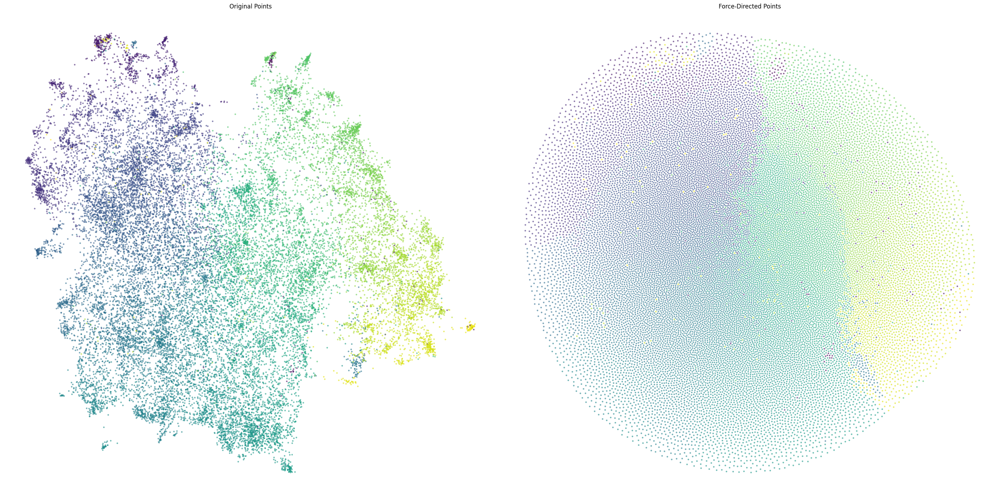

In [81]:
import matplotlib.pyplot as plt

# Create a figure with two subplots side by side
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(28.44, 14.22))  # Double width to accommodate both plots

# Plot original points on the left
scatter1 = ax1.scatter(points[:, 0], points[:, 1], s=5, alpha=0.5, c=colors)
ax1.axis('off')
ax1.set_title('Original Points')

# Plot force-directed points on the right
scatter2 = ax2.scatter(fpoints[:, 0], fpoints[:, 1], s=5, alpha=0.5, c=colors)
ax2.axis('off')
ax2.set_title('Force-Directed Points')

# Adjust layout
plt.tight_layout()
plt.show()

In [82]:
points[0:2]

array([[ 0.51556146, -0.06895757],
       [-0.75834376,  0.3057326 ]], dtype=float32)

In [ ]:
# Align to grid
aligned_points = align_points_to_grid(points, grid_size=(160, 160), verbose=True, chunk_size=1000)


Processing 24576 points...
Normalizing points...
Creating 160x160 grid...
Selecting 24576 grid points from 25600 available...
Finding closest original points to grid points...
Sorting grid points by distance...
Computing cost matrix for assignment problem...


Computing distances: 100%|██████████| 24576/24576 [00:06<00:00, 3791.94point/s]


Cost matrix computation completed in 6.48 seconds
Solving assignment problem with progress tracking...
Processing 24576x24576 assignment matrix in chunks of 1000...


Processing rows 24000-24575: 100%|██████████| 25/25 [00:09<00:00,  2.75it/s, remaining=0]    

Chunked assignment complete - assigned 24576 points
Applying grid alignment...
Grid alignment completed successfully!


In [101]:
faligned_points = align_points_to_grid(fpoints, grid_size=(160, 160), verbose=True, chunk_size=1000)

Processing 24576 points...
Normalizing points...
Creating 160x160 grid...
Selecting 24576 grid points from 25600 available...
Finding closest original points to grid points...
Sorting grid points by distance...
Computing cost matrix for assignment problem...


Computing distances: 100%|██████████| 24576/24576 [00:06<00:00, 3879.74point/s]


Cost matrix computation completed in 6.34 seconds
Solving assignment problem with progress tracking...
Processing 24576x24576 assignment matrix in chunks of 1000...


Processing rows 24000-24575: 100%|██████████| 25/25 [00:08<00:00,  2.84it/s, remaining=0]    

Chunked assignment complete - assigned 24576 points
Applying grid alignment...
Grid alignment completed successfully!


In [57]:
aligned_points[0:2]

array([[ 0.51494869, -0.06898005],
       [-0.75860999,  0.30597694]])

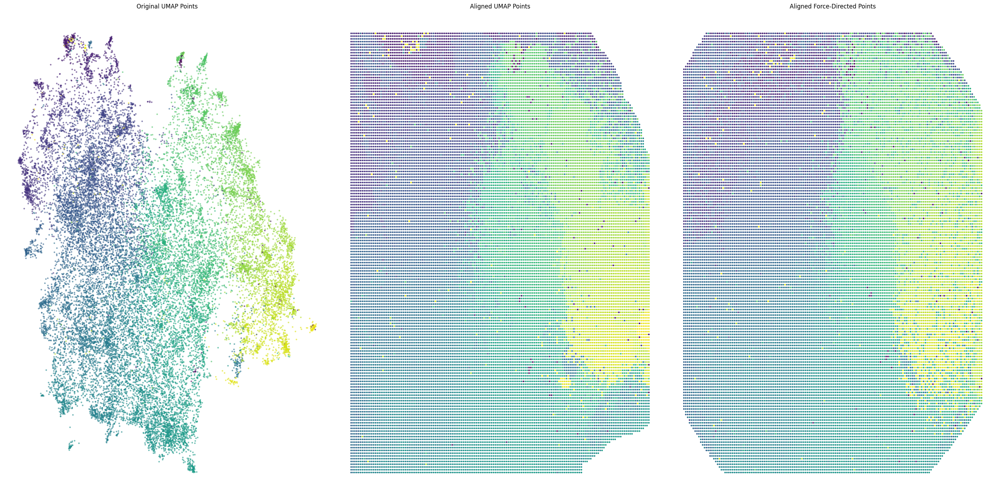

In [104]:
import matplotlib.pyplot as plt

# Create a figure with two subplots side by side
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(28.44, 14.22))  # Double width to accommodate both plots

# Plot original points on the left
scatter1 = ax1.scatter(points[:, 0], points[:, 1], s=5, alpha=0.5, c=colors)
ax1.axis('off')
ax1.set_title('Original UMAP Points')

# Plot aligned points on the middle
scatter2 = ax2.scatter(aligned_points[:, 0], aligned_points[:, 1], s=5, alpha=1, c=colors)
ax2.axis('off')
ax2.set_title('Aligned UMAP Points')

# Plot force-directed points on the right
scatter3 = ax3.scatter(faligned_points[:, 0], faligned_points[:, 1], s=5, alpha=1, c=colors)
ax3.axis('off')
ax3.set_title('Aligned Force-Directed Points')

# Adjust layout
plt.tight_layout()
plt.show()

In [97]:
directory = "data/umap_force_layout.15.5dt.02.rgrid"
os.makedirs(directory, exist_ok=True)
for i in tqdm(range(0, 100)):
  preserve_factor = 1 - i / 100
  # can interpolate between original points or fpoints (force directed points)
  # final_points = preserve_factor * fpoints + (1 - preserve_factor) * aligned_points
  final_points = preserve_factor * points + (1 - preserve_factor) * raligned_points
  fig, ax = plt.subplots(figsize=(14.22, 14.22))  # 1024px by 1024px at 72 dpi
  point_size = 5
  # Scatter plot with colors based on order
  scatter = plt.scatter(final_points[:, 0], final_points[:, 1], s=point_size, alpha=0.5, c=colors)
  plt.axis('off')  # remove axis
  plt.gca().set_position([0, 0, 1, 1])  # remove margins
  #save plot
  plt.savefig(f"{directory}/iteration_{i:04d}.png", dpi=100)
  plt.close()

  0%|          | 0/100 [00:00<?, ?it/s]

100%|██████████| 100/100 [00:46<00:00,  2.15it/s]


In [42]:
# # Add grid points to the dataframe
# fdf["grid_x"] = aligned_points[:, 0]
# fdf["grid_y"] = aligned_points[:, 1]

# # Save to parquet file
# # TODO: this should really be part of the umap output and then done in preapre_model
# fdf.to_parquet("data/features_grid.parquet")


In [105]:
# Calculate distances from original points
distances_aligned = np.sqrt(np.sum((points - aligned_points)**2, axis=1))
distances_faligned = np.sqrt(np.sum((points - faligned_points)**2, axis=1))


In [106]:
# Get overall statistics
print("Aligned points:")
print(f"Mean distance: {distances_aligned.mean():.4f}")
print(f"Max distance: {distances_aligned.max():.4f}")
print(f"Min distance: {distances_aligned.min():.4f}")
print("\nForce-directed aligned points:")
print(f"Mean distance: {distances_faligned.mean():.4f}")
print(f"Max distance: {distances_faligned.max():.4f}")
print(f"Min distance: {distances_faligned.min():.4f}")


Aligned points:
Mean distance: 0.2281
Max distance: 2.0485
Min distance: 0.0002

Force-directed aligned points:
Mean distance: 0.7178
Max distance: 2.5246
Min distance: 0.0010


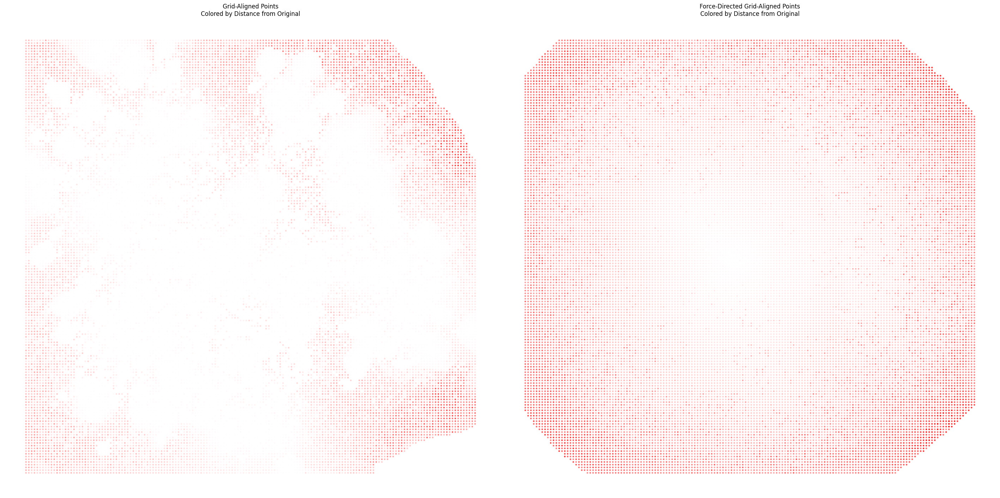

In [108]:
from matplotlib.colors import LinearSegmentedColormap
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(28.44, 14.22))

# Create colormap normalized to the maximum distance across both sets
max_distance = max(distances_aligned.max(), distances_faligned.max())
norm = plt.Normalize(vmin=0, vmax=max_distance)
# Add colorbar
colors = [(1, 1, 1), (1, 0, 0)]  # white to red
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

# Plot both sets of points
scatter1 = ax1.scatter(aligned_points[:, 0], aligned_points[:, 1], 
                      s=5, c=distances_aligned, cmap=cmap, norm=norm)
ax1.axis('off')
ax1.set_title('Grid-Aligned Points\nColored by Distance from Original')

scatter2 = ax2.scatter(faligned_points[:, 0], faligned_points[:, 1], 
                      s=5, c=distances_faligned, cmap=cmap, norm=norm)
ax2.axis('off')
ax2.set_title('Force-Directed Grid-Aligned Points\nColored by Distance from Original')




plt.tight_layout()
plt.show()

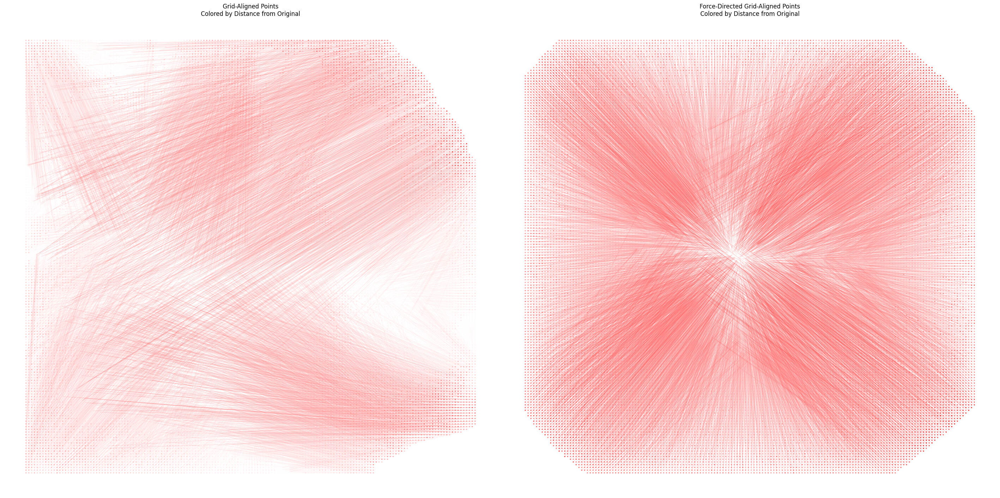

In [110]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(28.44, 14.22))

# Create colormap normalized to the maximum distance across both sets
max_distance = max(distances_aligned.max(), distances_faligned.max())
norm = plt.Normalize(vmin=0, vmax=max_distance)
colors = [(1, 1, 1), (1, 0, 0)]  # white to red
cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

# Plot lines and points for aligned points
for i in range(len(points)):
    color = cmap(norm(distances_aligned[i]))
    ax1.plot([points[i,0], aligned_points[i,0]], 
             [points[i,1], aligned_points[i,1]], 
             color=color, linewidth=0.5, alpha=0.3)
scatter1 = ax1.scatter(aligned_points[:, 0], aligned_points[:, 1], 
                      s=2, c=distances_aligned, cmap=cmap, norm=norm)
ax1.axis('off')
ax1.set_title('Grid-Aligned Points\nColored by Distance from Original')

# Plot lines and points for force-directed aligned points
for i in range(len(points)):
    color = cmap(norm(distances_faligned[i]))
    ax2.plot([points[i,0], faligned_points[i,0]], 
             [points[i,1], faligned_points[i,1]], 
             color=color, linewidth=0.5, alpha=0.3)
scatter2 = ax2.scatter(faligned_points[:, 0], faligned_points[:, 1], 
                      s=2, c=distances_faligned, cmap=cmap, norm=norm)
ax2.axis('off')
ax2.set_title('Force-Directed Grid-Aligned Points\nColored by Distance from Original')


plt.tight_layout()
plt.show()